# **Lab 5.2 Denoise & Deblur image with Autoencoder**

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Subset
from torch.utils.tensorboard import SummaryWriter
import copy

import numpy as np
import cv2
import os
import random
from skimage.util import random_noise
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm


## Data Preparation
Complete the class `CustomImageDataset()` that `__getitem__` return ***noisy blury*** image and ***ground truth*** image.
Please ensure that the final image is in RGBscale and has a size of 128x128.
The gaussian blur kernel size parameter should be random in the range [3,11]
and gaussian noise mean should be randoom in range [-50,50].

Parameters:
- image_paths: A list of paths to the images to be loaded.
- gauss_noise: A boolean flag to indicate if Gaussian noise should be added to the image.
- gauss_blur: A boolean flag to indicate if Gaussian blur should be applied to the image.
- resize: The size to which the image should be resized.
- p: Probability of applying certain transformations (like Gaussian noise or blur).

In [ ]:
### START CODE HERE ###
class CustomImageDataset(Dataset):
    def __init__(self, image_paths, gauss_noise=False, gauss_blur=False, resize=128, p=0.5, center_crop=None, seed=42):
        self.p = p
        self.resize = resize
        self.gauss_noise = gauss_noise
        self.gauss_blur = gauss_blur
        self.center_crop = center_crop
        self.image_paths = image_paths
        self.seed = seed
        np.random.seed(self.seed)
        random.seed(self.seed)

    def __len__(self):
        return len(self.image_paths)

    def add_gaussian_noise(self, image):
        mean = random.randint(-50, 50) / 255.0
        noisy_image = random_noise(image, var=0.01, mean=mean)
        return np.clip(noisy_image, 0, 1).astype(np.float32)

    def add_gaussian_blur(self, image):
        kernel_size = random.randrange(3, 12, 2)
        blurred_image = cv2.GaussianBlur((image * 255).astype(np.uint8), (kernel_size, kernel_size), 0)
        return blurred_image.astype(np.float32) / 255.0

    def __getitem__(self, idx):

        image_paths = self.image_paths[idx]
        image = cv2.imread(image_paths)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (self.resize, self.resize))
        gt_image = image.copy()
        
        image = image.astype(np.float32) / 255.0
        gt_image = gt_image.astype(np.float32) / 255.0

        if self.gauss_noise:
            image = self.add_gaussian_noise(image)
        if self.gauss_blur:
            image = self.add_gaussian_blur(image)

        image = transforms.ToTensor()(image)
        gt_image = transforms.ToTensor()(gt_image)

        if self.center_crop:
            image = transforms.CenterCrop(self.center_crop)(image)
            gt_image = transforms.CenterCrop(self.center_crop)(gt_image)

        return image, gt_image
### END CODE HERE ###

Use your [`CustomImageDataset()`](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#:~:text=transformed_dataset%20%3D%20FaceLandmarksDataset,3%3A%0A%20%20%20%20%20%20%20%20break)  to load the dataset in the cell below. Then, display the image from the first batch.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Noisy blury images (this reference use salt and pepper noise)<br>
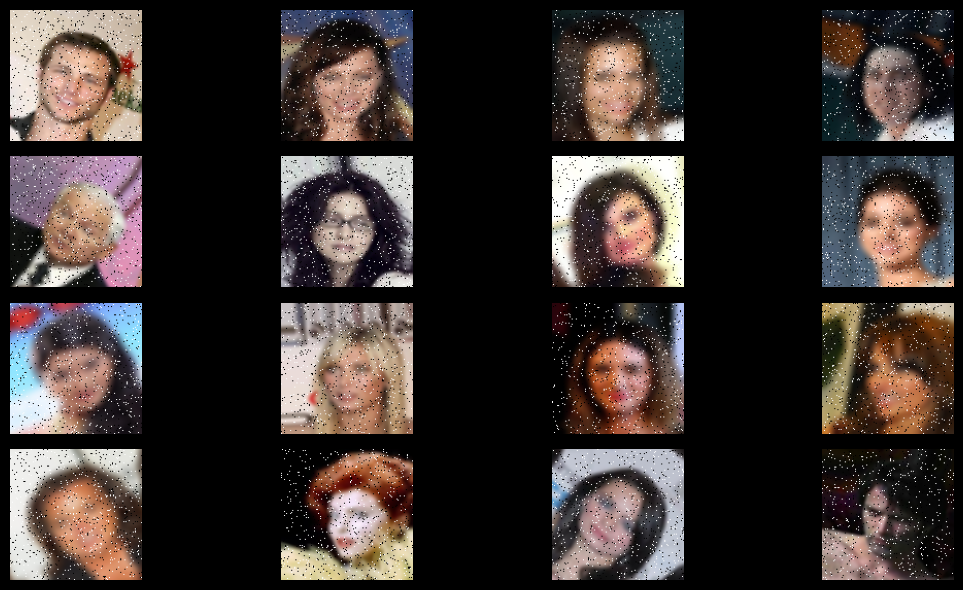

- Ground Truth images<br>
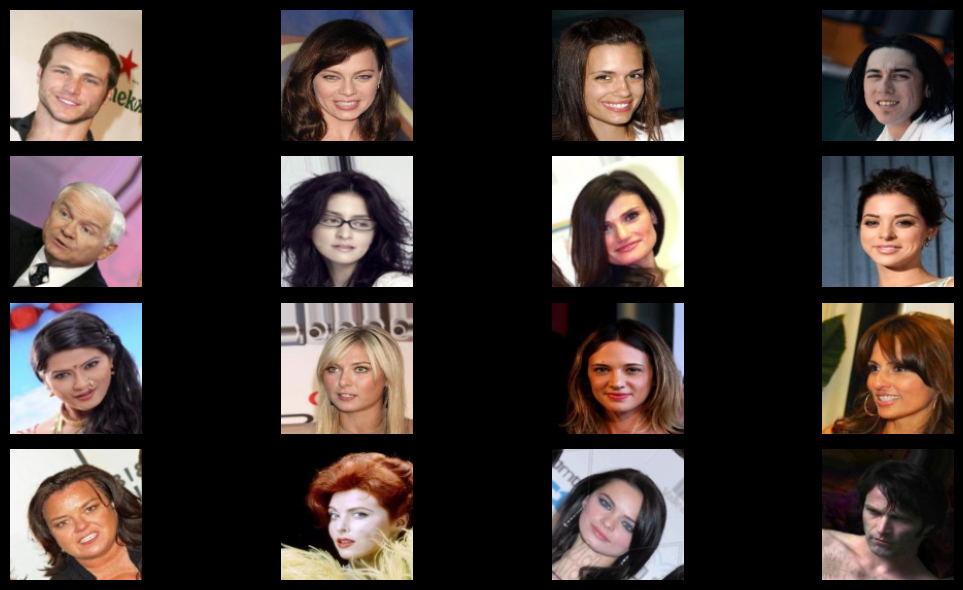

</details>

Complete the function below

In [3]:
### START CODE HERE ###
import torchvision
def imshow_grid(images):
    if isinstance(images, torch.Tensor):
        if images.dim() == 3:
            images = images.unsqueeze(0)
        elif images.dim() > 4:
            raise ValueError("Input should be a 3D or 4D tensor.")
    elif isinstance(images, (list, tuple)):
        images = torch.stack(images)
    else:
        raise TypeError(f"Unsupported type: {type(images)}")

    grid = torchvision.utils.make_grid(images, nrow=4, padding=2)
    plt.imshow(grid.permute(1, 2, 0).cpu())
    plt.axis("off")
    plt.tight_layout()
    plt.show()

In [4]:

### START CODE HERE ###
data_dir = "./data/img_align_celeba"
train, test = train_test_split(os.listdir(data_dir), test_size=0.2, random_state=42)
train_files = [os.path.join(data_dir, f) for f in train]
test_files = [os.path.join(data_dir, f) for f in test]
dataset = CustomImageDataset(   
                                image_paths=train_files,
                                resize=128,
                                center_crop=128,
                                gauss_noise=True,
                                gauss_blur=True
                            )
dataloader = DataLoader(dataset, batch_size=16, shuffle=False, num_workers=0)
### END CODE HERE ###

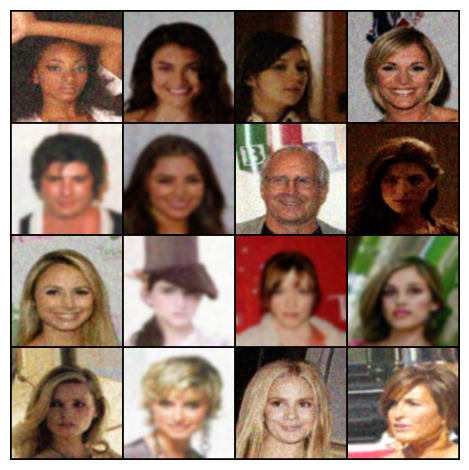

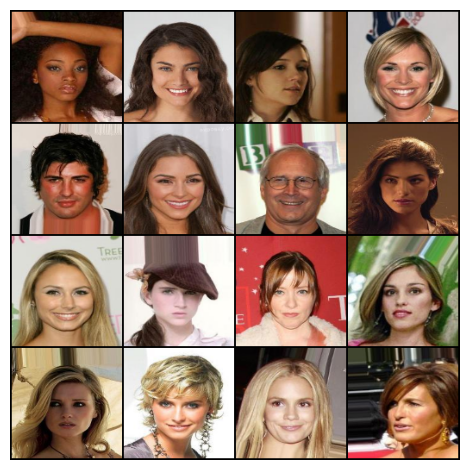

In [5]:
### START CODE HERE ###
batch, gt_img = next(iter(dataloader)) 
imshow_grid(batch)
imshow_grid(gt_img)
### END CODE HERE ###

## Create Autoencoder model
You can design your own Autoencoder model based on the provided code below. However, please maintain the concept of 'Autoencoder'.
[Read more.](https://pytorch.org/tutorials/beginner/introyt/modelsyt_tutorial.html)

In [6]:
### START CODE HERE ###
class DownSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(DownSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.pool(x)
        return x

class UpSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(UpSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.upsample(x)
        return x

class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        # Encoder
        self.conv_in = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.down1 = DownSamplingBlock(64, 128, kernel_size=3, stride=1, padding=1) # H/2, W/2
        # self.down2 = DownSamplingBlock(128, 256, kernel_size=3, stride=1, padding=1) # H/4, W/4
        # self.down3 = DownSamplingBlock(256, 512, kernel_size=3, stride=1, padding=1) # H/8, W/8
        
        # Decoder
        # self.up1 = UpSamplingBlock(512, 256, kernel_size=3, stride=1, padding=1) # H/4, W/4
        # self.up2 = UpSamplingBlock(256, 128, kernel_size=3, stride=1, padding=1) # H/2, W/2
        self.up3 = UpSamplingBlock(128, 64, kernel_size=3, stride=1, padding=1) # H, W
        # self.up4 = UpSamplingBlock(128, 64, kernel_size=3, stride=1, padding=1)
        # self.conv = nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1)
        self.conv_out = nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1)
        # self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # Encoder
        x = self.conv_in(x)
        x = self.down1(x)
        # x = self.down2(x)
        # x = self.down3(x)

        # Decoder
        # x = self.up1(x)
        # x = self.up2(x)
        x = self.up3(x)
        x = self.conv_out(x)
        # x = self.sigmoid(x)
        return x
### END CODE HERE ###

If you define your model class correcly, the cell below should run without any errors.

In [7]:
model = Autoencoder()
print(model)
out = model(batch[0].unsqueeze(dim=0).float())

Autoencoder(
  (conv_in): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (down1): DownSamplingBlock(
    (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (up3): UpSamplingBlock(
    (conv): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (upsample): Upsample(scale_factor=2.0, mode='bilinear')
  )
  (conv_out): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)


## Train Autoencoder
Complete the `train()` function in the cell below. This function should evaluate the model at every epoch, log the ***training loss, test loss,test PSNR, test SSIM***. Additionally, it should save the model at the last epoch.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The log should resemble this, but not be identical

```
🤖Training on cuda
🚀Training Epoch [1/1]: 100%|██████████| 1313/1313 [01:45<00:00, 12.41batch/s, loss=0.0102] 
📄Testing: 100%|██████████| 563/563 [01:10<00:00,  7.95batch/s, loss=0.0106, psnr=16.7, ssim=0.348] 
Summary :
	Train	avg_loss: 0.017262999383663165
	Test	avg_loss: 0.010476540363861867 
                PSNR : 16.839487147468034 
                SSIM : 0.36090552368883694
...
```

</details>

Resource : [PyTorch Training loop](<https://pytorch.org/tutorials/beginner/introyt/trainingyt.html#:~:text=%3D0.9)-,The%20Training%20Loop,-Below%2C%20we%20have>), [PSNR & SSIM](https://ieeexplore.ieee.org/document/5596999)

In [ ]:
### START CODE HERE ###
def train(model, opt, loss_fn, train_loader, test_loader, epochs=10, checkpoint_path=None,device='cpu'):
    
    if checkpoint_path and not os.path.exists(checkpoint_path):
        os.makedirs(checkpoint_path, exist_ok=True)
            
    print("🤖Training on", device)
    model = model.to(device)
    
    for epoch in range(epochs):

        # Training
        model.train()
        train_losses = []
        avg_train_loss = 0
        train_bar = tqdm(train_loader, desc=f'🚀Training Epoch [{epoch+1}/{epochs}]',unit='batch')
        
        for images, gt in train_bar:
            images, gt = images.to(device), gt.to(device)
            opt.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs, gt)
            loss.backward()
            opt.step()

            train_losses.append(loss.item())
            train_bar.set_postfix({'loss': loss.item()})
        avg_train_loss = np.mean(train_losses) if train_losses else 0

        # Testing
        model.eval()
        test_losses, psnr_values, ssim_values = [], [], []
        avg_test_loss, avg_psnr, avg_ssim = 0, 0, 0
        test_bar = tqdm(test_loader,desc='📄Testing',unit='batch')
        
        with torch.no_grad():
            for images, gt in test_bar:
                
                images, gt = images.to(device), gt.to(device)
                outputs = model(images)
                loss = loss_fn(outputs, gt)
                test_losses.append(loss.item())
                
                # PSNR & SSIM
                output_np = outputs.detach().cpu().numpy()
                gt_np = gt.detach().cpu().numpy()

                # [N, C, H, W] -> [N, H, W, C]
                output_np = np.transpose(output_np, (0, 2, 3, 1))
                gt_np = np.transpose(gt_np, (0, 2, 3, 1))
                
                # batch-level calculation
                batch_psnr = [psnr(
                                gt_np[i], output_np[i], 
                                data_range=1.0) 
                            for i in range(len(gt_np))]
                
                h, w, _ = output_np[0].shape
                batch_ssim = [ssim(   
                                gt_np[i], output_np[i], 
                                data_range=1.0, 
                                channel_axis=-1,
                                win_size=7 if min(h, w) >= 7 else 3)
                            for i in range(len(gt_np))]

                psnr_values.extend(batch_psnr)
                ssim_values.extend(batch_ssim)

                test_bar.set_postfix({
                    'loss': loss.item(),
                    'psnr': np.mean(batch_psnr),
                    'ssim': np.mean(batch_ssim)
                })
        avg_test_loss = np.mean(test_losses) if test_losses else 0
        avg_psnr = np.mean(psnr_values) if psnr_values else 0
        avg_ssim = np.mean(ssim_values) if ssim_values else 0

        # Save model at last epoch
        if checkpoint_path is not None:

            torch.save(model.state_dict(), os.path.join(checkpoint_path, f"epoch_{epoch+1}.pth"))
            # print(f"💾 Model saved to {checkpoint_path}")
        
        # Summary
        print("Summary :")
        print(f"\tTrain\tavg_loss: {avg_train_loss:.6f}")
        print(f"\tTest\tavg_loss: {avg_test_loss:.6f} ")
        print(f"\t\tPSNR : {avg_psnr:.4f} ")
        print(f"\t\tSSIM : {avg_ssim:.4f}")
        
### END CODE HERE ###

Let's train your model.

In [9]:
### START CODE HERE ###

data_dir = "./data/img_align_celeba"

files = os.listdir(data_dir)
files = [os.path.join(data_dir, file) for file in files]

# Split the dataset into training and testing sets
train_files, test_files = train_test_split(files, test_size=0.3, random_state=42)

train_dataset = CustomImageDataset( train_files, 
                                    resize=128,
                                    gauss_noise=True,
                                    gauss_blur=True,
                                    center_crop=128
                                    )
test_dataset = CustomImageDataset(  test_files, 
                                    resize=128,
                                    gauss_noise=True,
                                    gauss_blur=True,
                                    center_crop=128
                                    )
trainloader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=0)
testloader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
### END CODE HERE ###

In [ ]:
### START CODE HERE ###
model = Autoencoder()
opt = optim.Adam(model.parameters(), lr=0.001)
loss_fn = nn.MSELoss()
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
checkpoint_path = './checkpoints'
train(model, opt, loss_fn, trainloader, testloader, epochs=1, device=device, checkpoint_path=checkpoint_path)

writer = SummaryWriter(log_dir='./runs/autoencoder')

# Log model graph
dummy_input = torch.randn(1, 3, 128, 128).to(device)
writer.add_graph(model, dummy_input)

# Log weights as histograms
for name, param in model.named_parameters():
    writer.add_histogram(name, param, global_step=0)

# Log sample input and reconstruction images
sample_img, _ = next(iter(dataloader))
sample_img = sample_img.to(device)
with torch.no_grad():
    output = model(sample_img)

# [B, C, H, W] for Tensorboard
writer.add_images('Input Images', sample_img.cpu(), global_step=0)
writer.add_images('Reconstructed Images', output.cpu(), global_step=0)
writer.close()

print("Done! Run: tensorboard --logdir=runs to view TensorBoard")
### END CODE HERE ###

🤖Training on mps


📄Testing: 100%|██████████| 563/563 [00:53<00:00, 10.58batch/s, loss=0.00856, psnr=21.3, ssim=0.759]


Summary :
	Train	avg_loss: 0.013167
	Test	avg_loss: 0.010776 
		PSNR : 20.5071 
		SSIM : 0.7228
✅ Done! Run: tensorboard --logdir=runs to view TensorBoard


Let's use your trained model.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Input images<br>
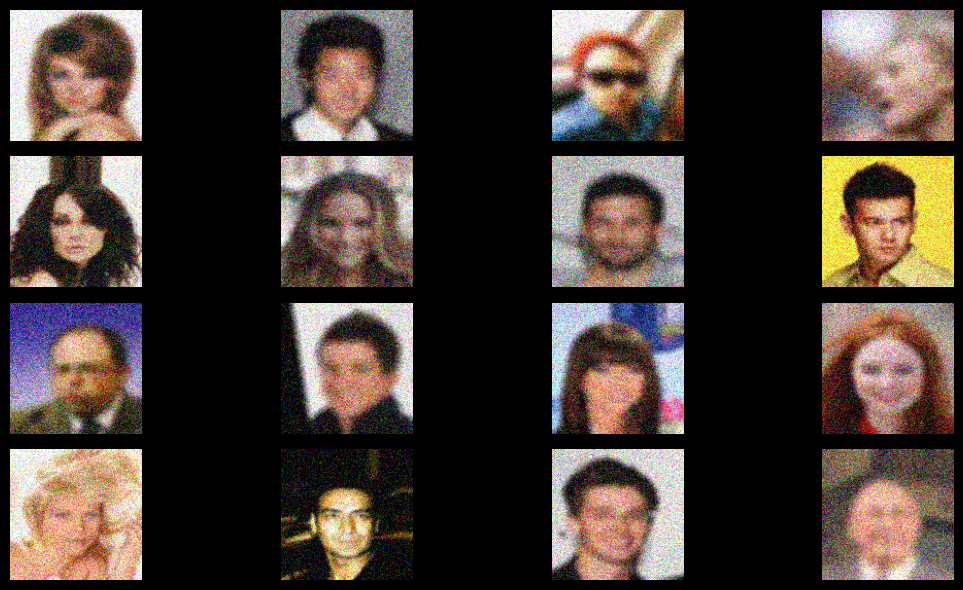

- Output images<br>
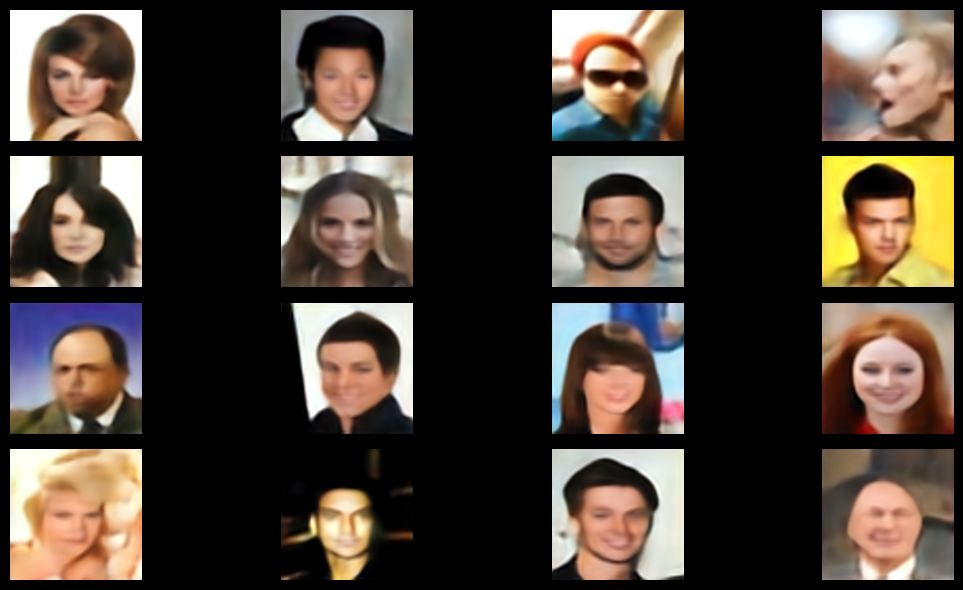

- Ground Truth images<br>
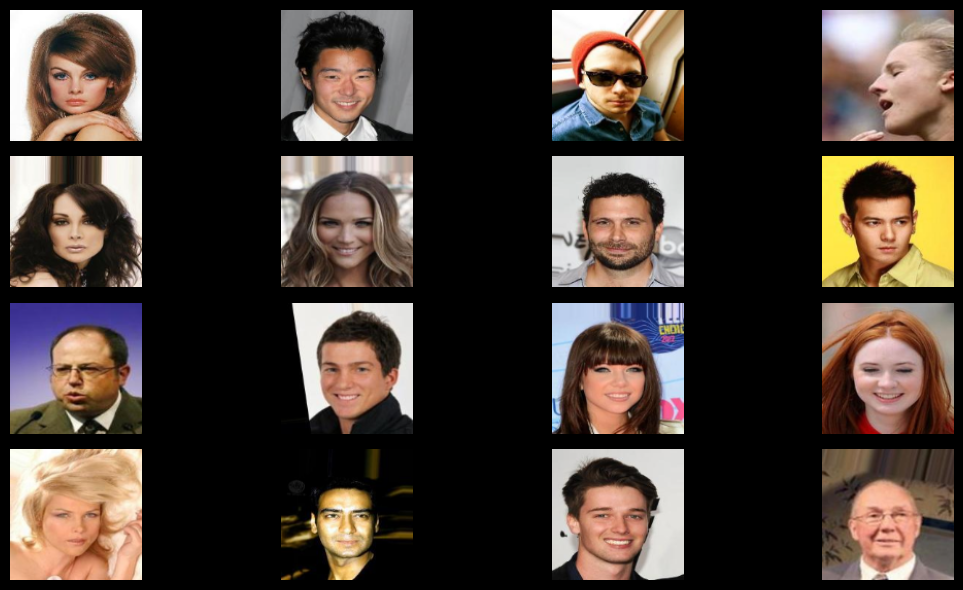

</details>

torch.Size([16, 3, 128, 128])


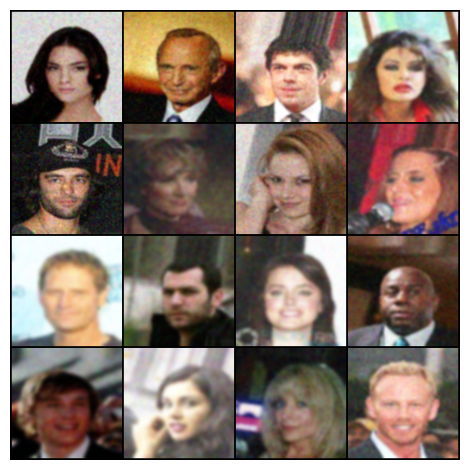

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1892829].


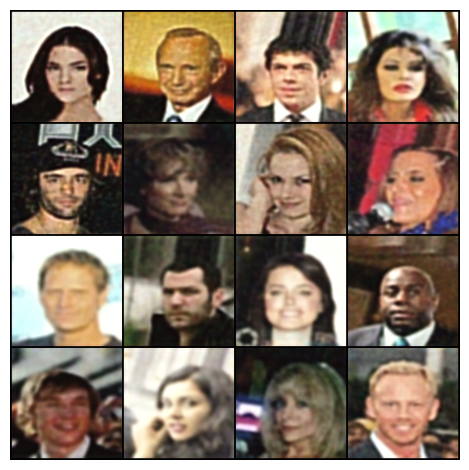

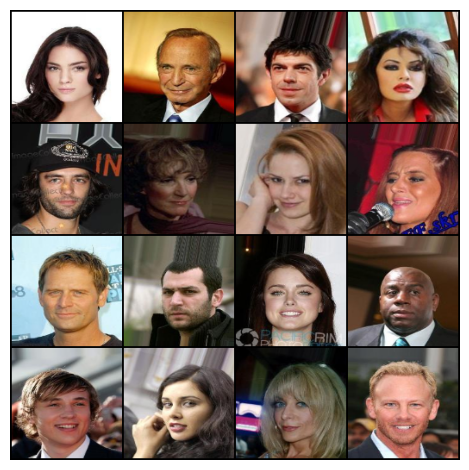

In [ ]:
### START CODE HERE ###

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
noisy_image, gt_image = next(iter(testloader))
out = model(noisy_image.float().to(device))
# print(out.shape)

imshow_grid(noisy_image)
imshow_grid(out.detach().cpu())
imshow_grid(gt_image)

### END CODE HERE ###

## Explore feature map
Use the `FeatureExtractor()` class and `visualize_feature_map()` function to visualize the feature map of ***ALL*** layers or block of your model. Then, save it as an image.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

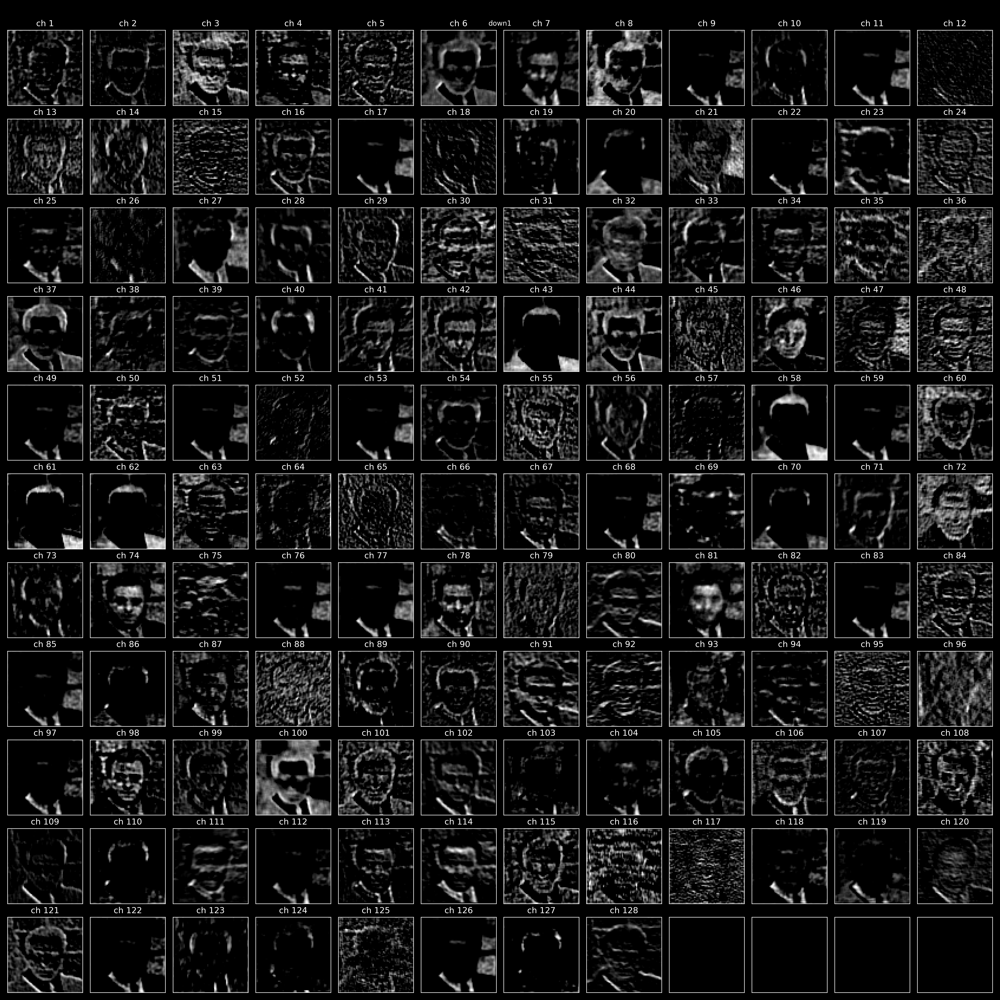
</details>

In [12]:
class FeatureExtractor(nn.Module):
    def __init__(self, model, target_layers):
        super(FeatureExtractor, self).__init__()
        self.model = copy.deepcopy(model)
        self.target_layers = target_layers
        self.features = []

        for layer_name, layer in self.model.named_modules():
            if layer_name in target_layers:
                layer.register_forward_hook(self.save_feature(layer_name))

    def save_feature(self, layer_name):
        def hook(module, input, output):
            self.features.append(output)
        return hook

    def forward(self, x):
        self.features = []
        self.model(x)
        return self.features

In [ ]:
### START CODE HERE ###
def visualize_feature_map(x, base_filename):
    result_dir = "./feature_maps"
    os.makedirs(result_dir, exist_ok=True)
    
    x_ch_last = x[0].permute(1, 2, 0).cpu()
    channels = x_ch_last.size(2)
    rows = int(channels ** 0.5)
    columns = (channels // rows) + (1 if channels % rows != 0 else 0)

    # Plot feature maps
    fig, axes = plt.subplots(rows, columns, figsize=(columns * 2, rows * 2))
    for channel in range(channels):
        r = channel // columns
        c = channel % columns
        ax = axes[r, c] if rows > 1 else axes[c]
        ax.set_title(f"ch {channel + 1}")
        ax.imshow(x_ch_last[:, :, channel].detach().numpy(), cmap='gray')
        ax.axis('off')

    filename = f"{base_filename}.png"
    count = 1
    while os.path.exists(os.path.join(result_dir,filename)):
        filename = f"{base_filename}_{count}.png"
        count += 1
    plt.tight_layout()
    plt.show()
    plt.savefig(os.path.join(result_dir, filename))
    plt.close()
    print(f"Saved as {filename}")

### END CODE HERE ###

layers: ['conv_in', 'down1', 'down1.conv', 'down1.relu', 'down1.pool', 'up3', 'up3.conv', 'up3.relu', 'up3.upsample', 'conv_out']	len: 10
['conv_in.weight', 'conv_in.bias', 'down1.conv.weight', 'down1.conv.bias', 'up3.conv.weight', 'up3.conv.bias', 'conv_out.weight', 'conv_out.bias']
Layer name: conv_in	Feature map shape: torch.Size([1, 64, 128, 128])


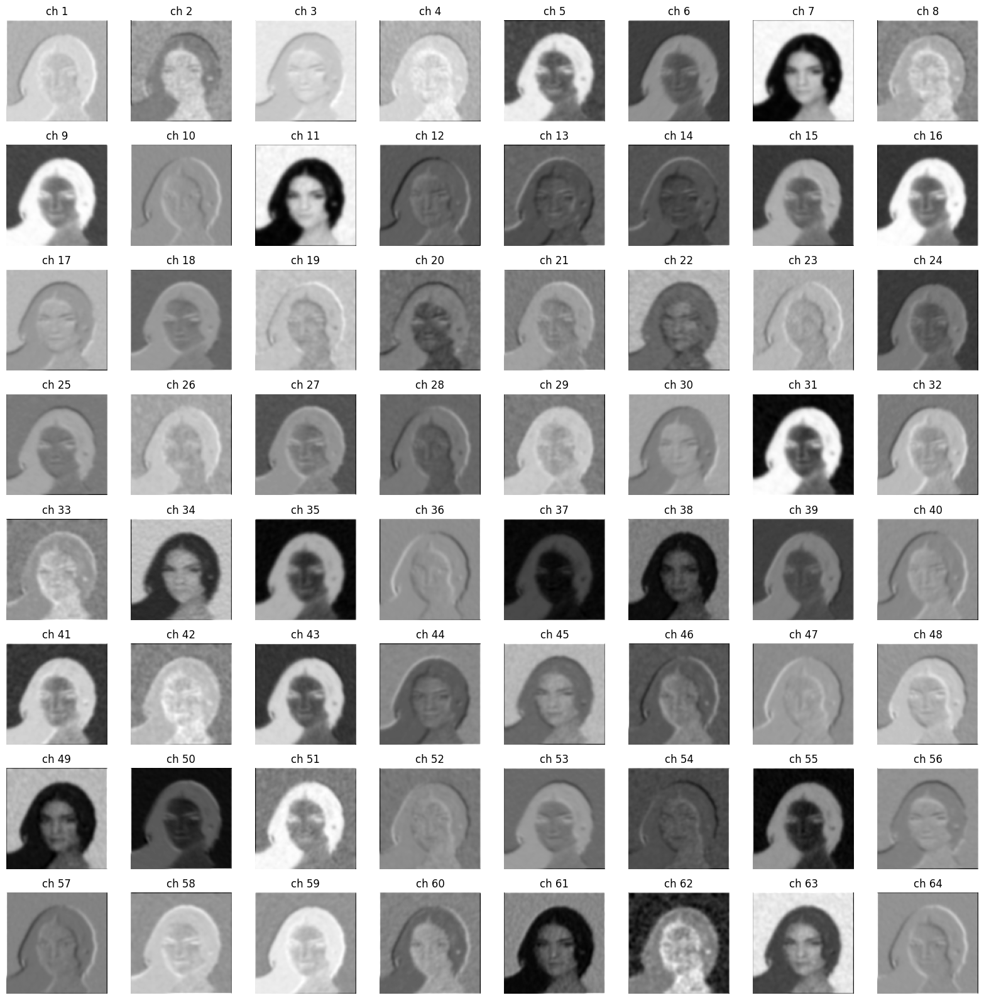

Saved as conv_in_5.png
Layer name: down1	Feature map shape: torch.Size([1, 128, 64, 64])


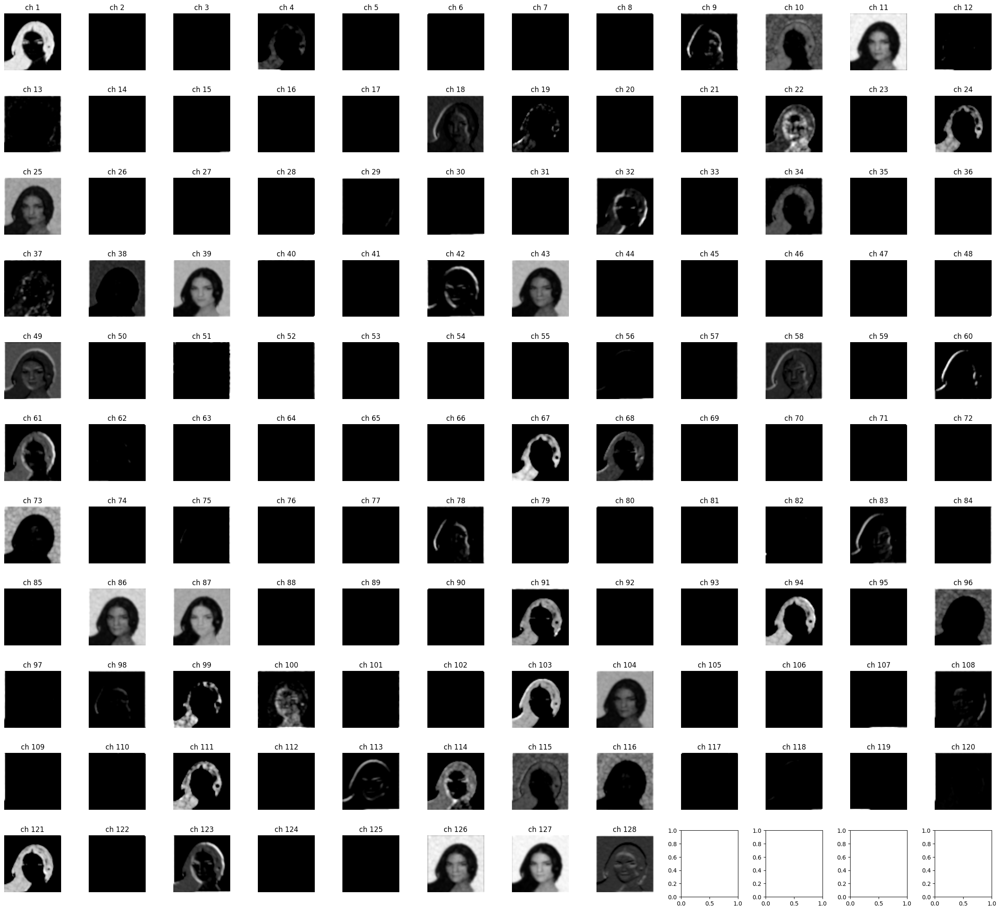

Saved as down1_5.png
Layer name: down1.conv	Feature map shape: torch.Size([1, 128, 128, 128])


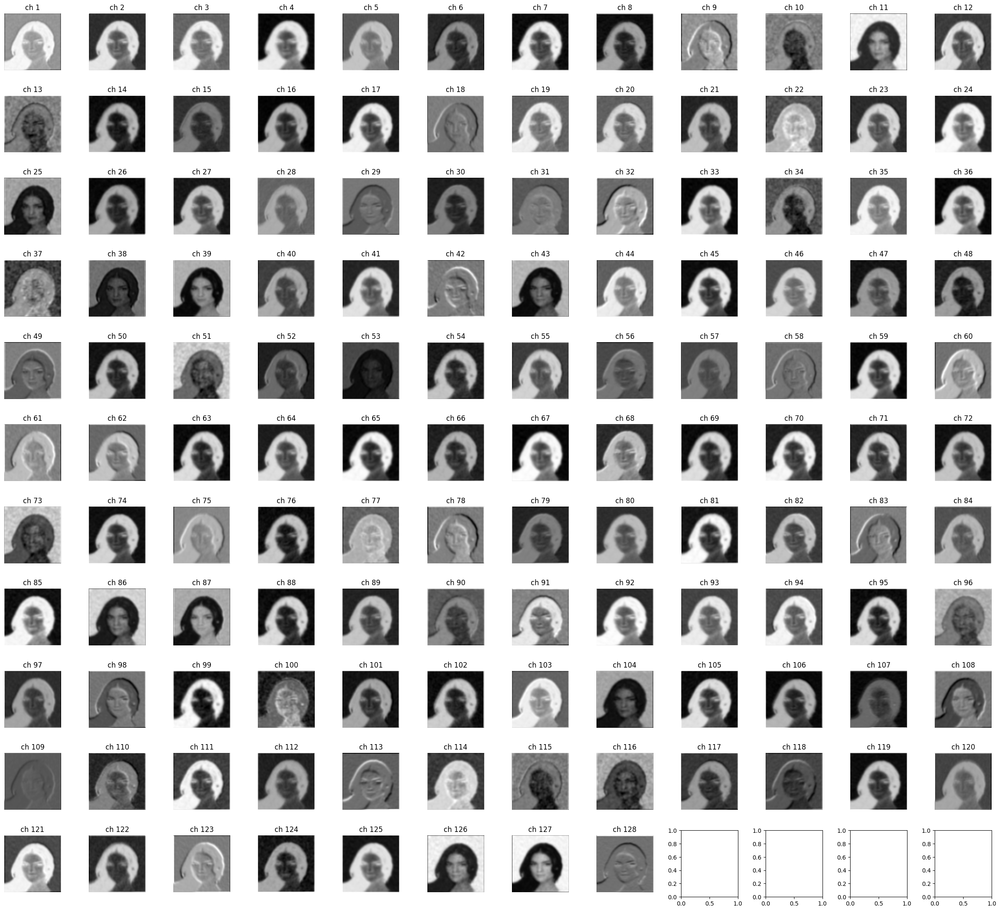

Saved as down1.conv_5.png
Layer name: down1.relu	Feature map shape: torch.Size([1, 128, 128, 128])


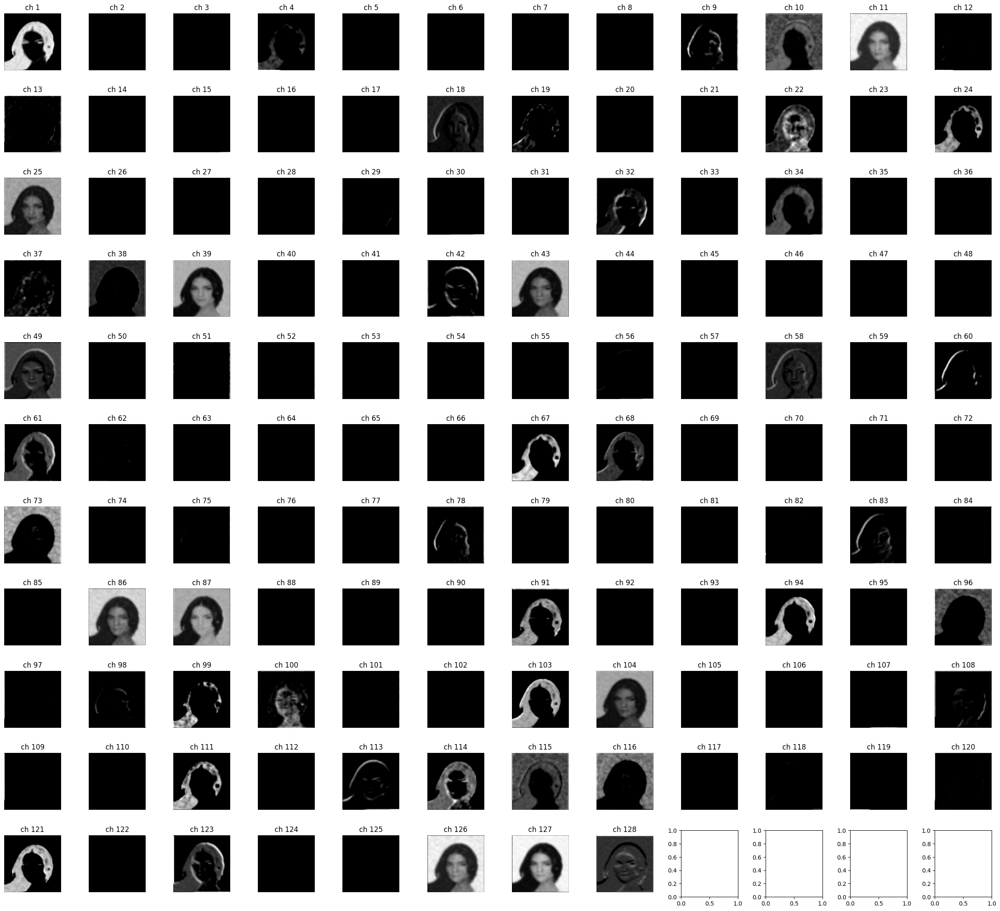

Saved as down1.relu_5.png
Layer name: down1.pool	Feature map shape: torch.Size([1, 128, 64, 64])


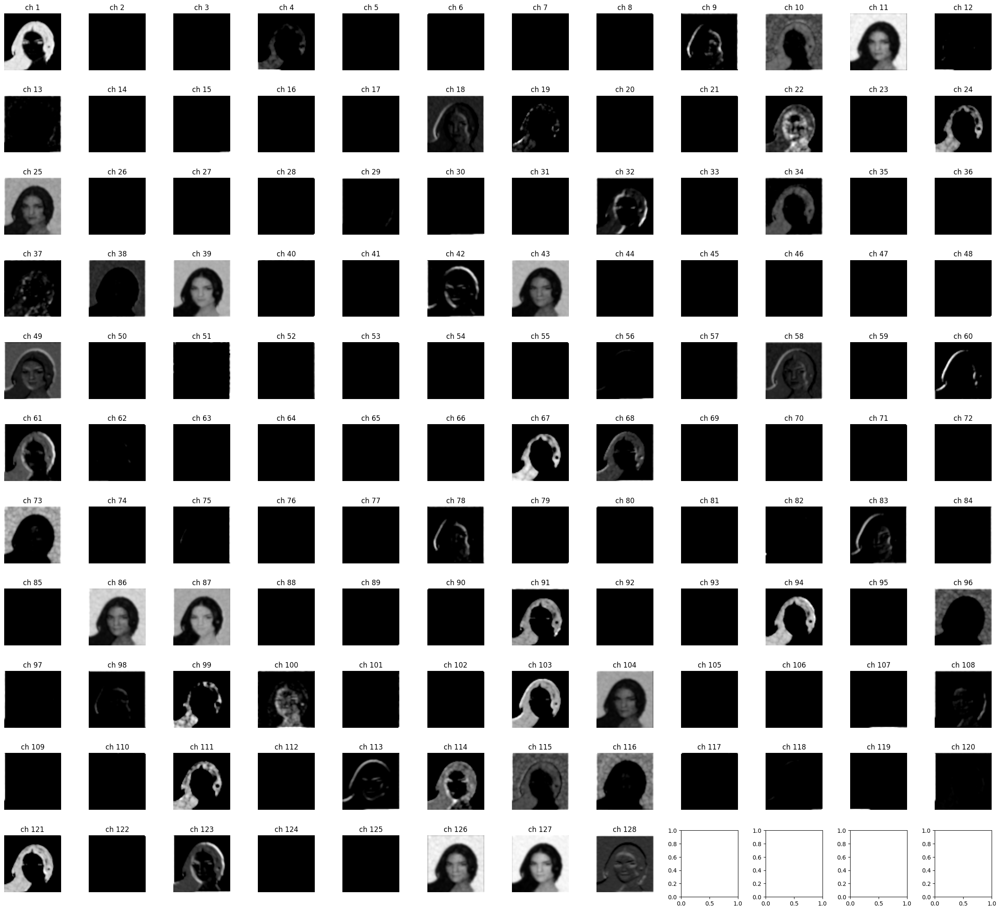

Saved as down1.pool_5.png
Layer name: up3	Feature map shape: torch.Size([1, 64, 128, 128])


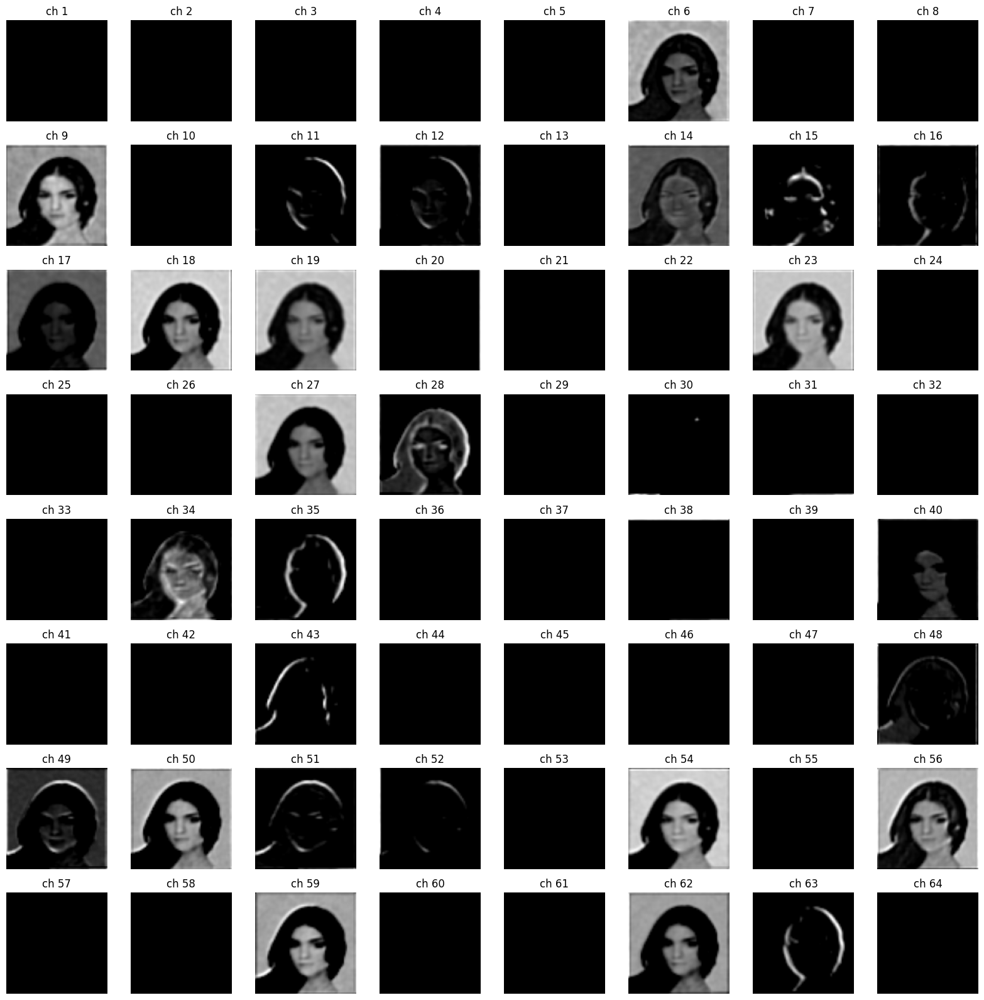

Saved as up3_5.png
Layer name: up3.conv	Feature map shape: torch.Size([1, 64, 64, 64])


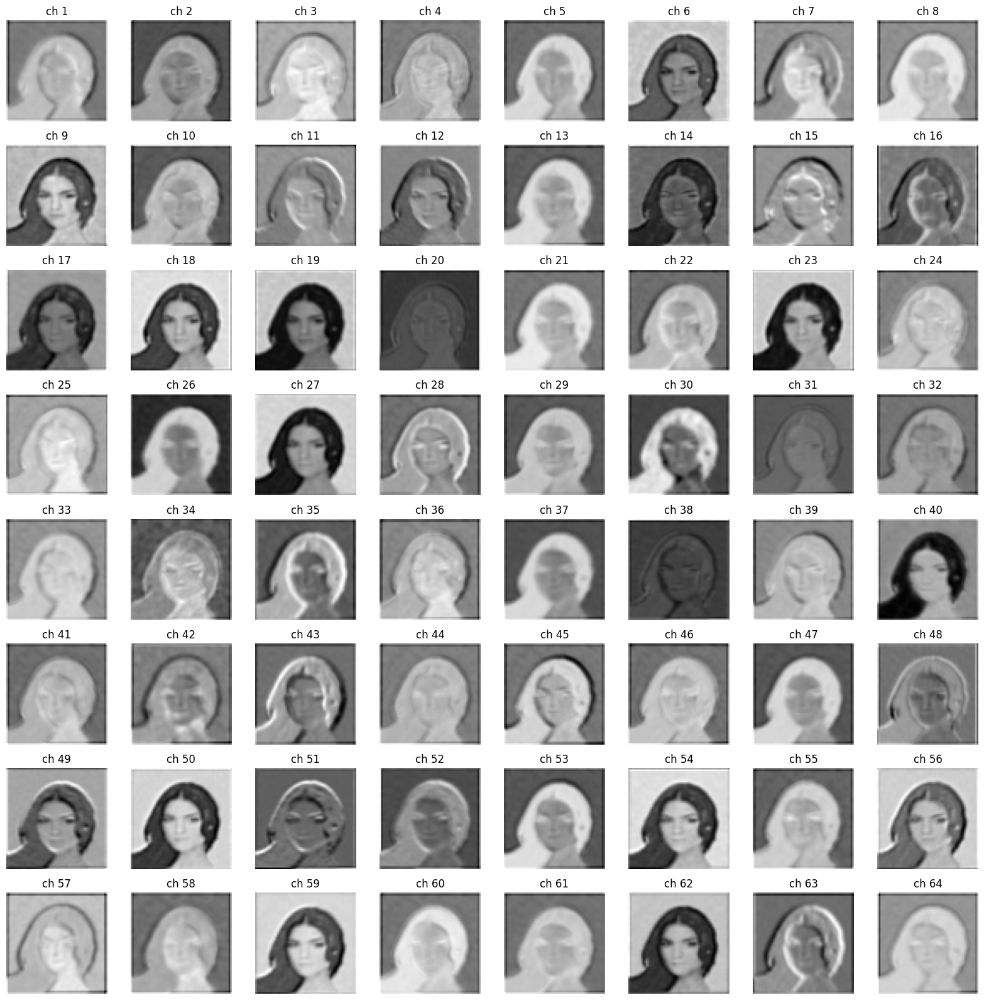

Saved as up3.conv_5.png
Layer name: up3.relu	Feature map shape: torch.Size([1, 64, 64, 64])


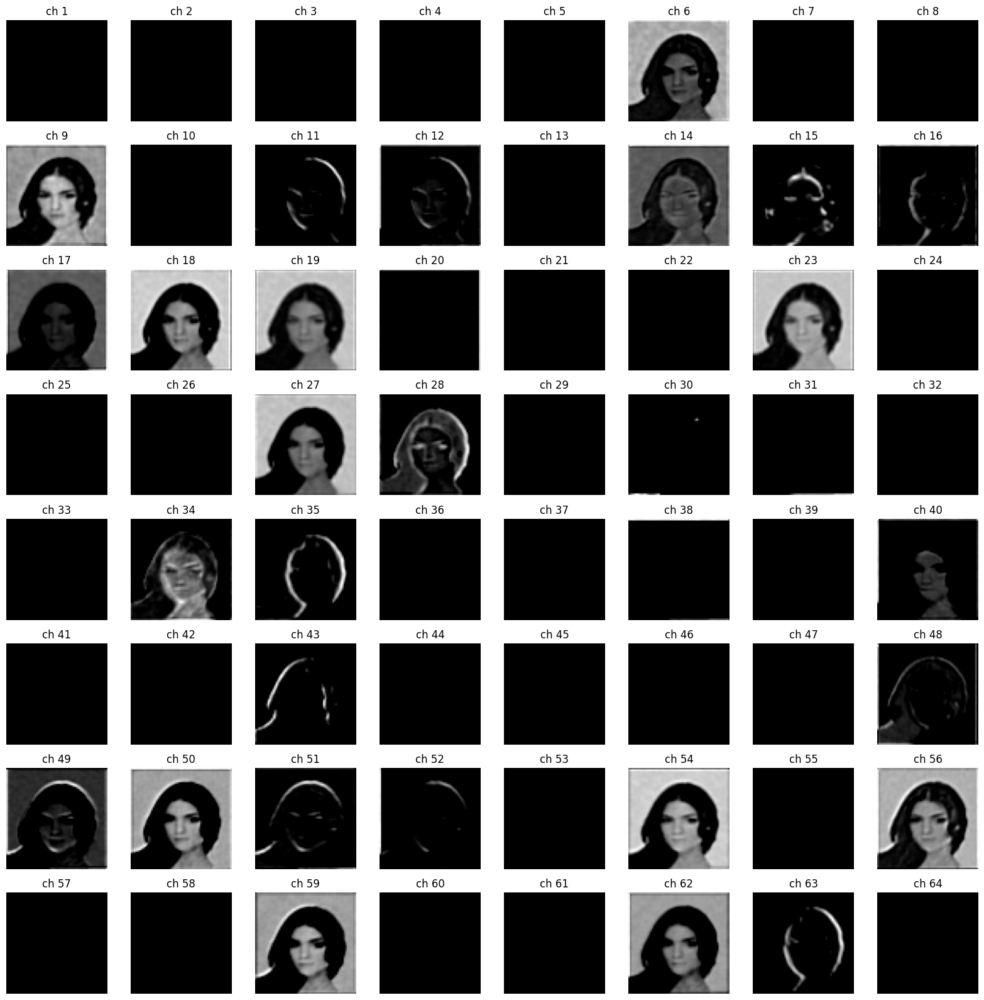

Saved as up3.relu_5.png
Layer name: up3.upsample	Feature map shape: torch.Size([1, 64, 128, 128])


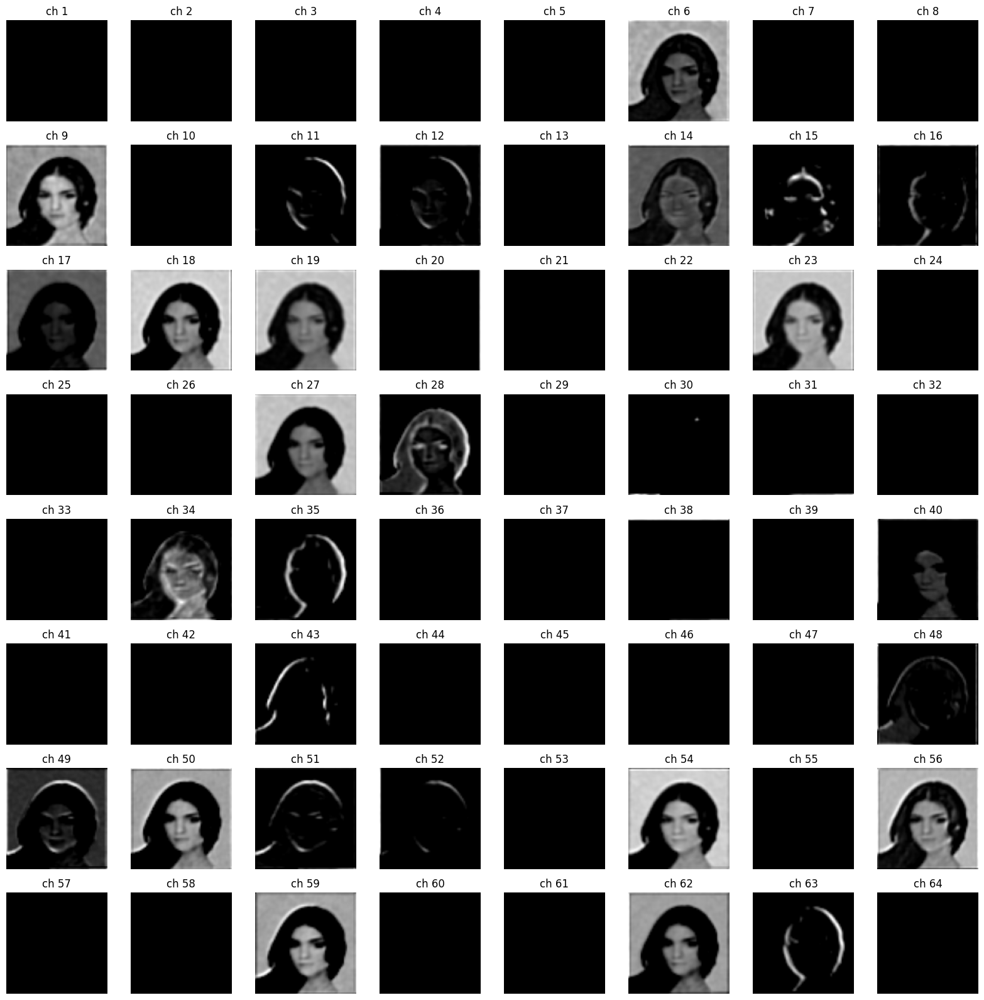

Saved as up3.upsample_5.png
Layer name: conv_out	Feature map shape: torch.Size([1, 3, 128, 128])


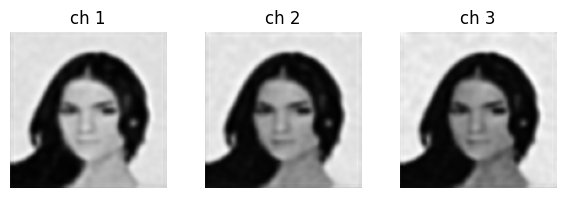

Saved as conv_out_4.png


In [ ]:
### START CODE HERE ###
layer_names = []
for layer_name, layer in model.named_modules():
    if layer_name == '':
        continue
    layer_names.append(layer_name)
print(f'layers: {layer_names}\tlen: {len(layer_names)}')


model = Autoencoder()
checkpoint = torch.load('./checkpoints/epoch_1.pth')
print(list(checkpoint.keys()))
model.load_state_dict(checkpoint)
noisy_img, gt_img = next(iter(testloader))
input_image = noisy_img[0].unsqueeze(dim=0)

# Extract feature maps
for i, layer_name in enumerate(layer_names):
    feature_extractor = FeatureExtractor(model, layer_name)
    featuremaps = feature_extractor(input_image)
    # print(f'Featuremaps: {featuremaps}')
    print(f"Layer name: {layer_names[i]}\tFeature map shape: {featuremaps[0].shape}")
    visualize_feature_map(featuremaps[0], layer_name)


### END CODE HERE ###

---

# Questions:
1. Explain how changing the number of layers and the number of nodes in a Convolutional Neural Network (CNN) affects its performance (model accuracy, training time, and generalization/overfitting?)  
2. Explain a comparison of PSNR and SSIM values (objective measurment) to your eye perception (subjective measurement) and suggest the criteria for High, Medium, Low image quality.
3. Explain a comparison of the autoencoder results between training without/with augmentation by visualizing feature maps at each layer.
4. Ranking the autoencoder performance in terms of PSNR and SSIM for each augmentation technique. Which augmentation techiques are mostly affect the autoencoder performance and must introduce to the training?
5. If a flatten layer is added after the last downsampling block to create the latent code (1D) and a dense layer ((linear + activation node)+ reshape back to the feature map size of input of the first upsampling block ) is added at the first layer of decoder before the first upsampling block. Explain a comparison of autoencoder results between 2D vs 1D latent and how feature map of each decoder block changes?
6. Explain the effect of reduced latent code from 2D to 1D.

# Answers:
1. อธิบายว่าการเปลี่ยนแปลงจำนวนเลเยอร์และจำนวนโหนดใน CNN ส่งผลต่อประสิทธิภาพการทำงานอย่างไร (ความแม่นยำของแบบจำลอง เวลาฝึก และการหาค่าทั่วไป/ค่าที่พอดีเกิน)
Ans: อาจทำให้โมเดลเก่งในการแยกแยะ features ขึ้น แต่เสี่ยง overfitting

2. อธิบายการเปรียบเทียบค่า PSNR และ SSIM (การวัดแบบวัตถุวิสัย) กับการรับรู้ทางสายตาของคุณ (การวัดแบบอัตนัย) และแนะนำเกณฑ์สำหรับคุณภาพของภาพสูง ปานกลาง และต่ำ
Ans: PSNR: ความชัด, SSIM: ความเนียน/เหมือนจริง
คุณภาพสูง: PSNR > 30 dB, SSIM > 0.9
คุณภาพปานกลาง: PSNR 25–30 dB, SSIM 0.7–0.9
คุณภาพต่ำ: PSNR < 25 dB, SSIM < 0.7

3. อธิบายการเปรียบเทียบผลลัพธ์ของ autoencoder ระหว่างการฝึกแบบไม่มี/มี augmentation โดยการแสดงภาพแผนที่คุณลักษณะในแต่ละเลเยอร์
Ans: ไม่ใช้ augmentation โมเดลจำข้อมูล model จำข้อมูล training ได้ดีกว่า, ใช้ augmentation โมเดลเรียนรู้ feature ที่ทนต่อการเปลี่ยนแปลงของภาพมากขึ้น
Feature maps ที่ได้จากการ visualize:
เทรนปกติ: feature maps จะชัดแต่ bias กับข้อมูลที่นำมา train
เทรนด้วย Augmentation: feature maps จะทน noise หนือการเปลี่ยนแปลงของภาพได้มากกว่า

4. จัดอันดับประสิทธิภาพของ autoencoder ในแง่ของ PSNR และ SSIM สำหรับเทคนิคการ augmentation แต่ละเทคนิค เทคนิค augmentation ใดที่มีผลต่อประสิทธิภาพ autoencoder มากที่สุดและต้องนำมาใช้ในการฝึก
Ans:
- Noise Injection (Gaussian/Poisson): สำคัญมาก เพราะ autoencoder มักใช้ทำ denoising
- Rotation / Flip: ช่วยให้โมเดลไม่จำภาพจากทิศทางเดิมๆ
- Blur / Brightness: ช่วยให้โมเดลรับมือกับความชัดหรือแสงของภาพได้

5. หากมีการเพิ่มเลเยอร์แบบ flatten หลังจากบล็อก downsampling สุดท้ายเพื่อสร้างโค้ดแฝง (1D) และเลเยอร์แบบหนาแน่น ((linear + activate node) + เปลี่ยนรูปร่างกลับเป็นขนาดแผนที่คุณลักษณะของอินพุตของบล็อก upsampling แรก ) จะถูกเพิ่มที่ชั้นแรกของตัวถอดรหัสก่อนบล็อกอัปแซมปลิงแรก อธิบายการเปรียบเทียบผลลัพธ์ของการเข้ารหัสอัตโนมัติระหว่างแฝงแบบ 2 มิติและ 1 มิติ และการเปลี่ยนแปลงของฟีเจอร์แมปของแต่ละบล็อกตัวถอดรหัสอย่างไร
Ans: 
2D latent: ภาพคมชัด รายละเอียดดี เพราะยังรักษาโครงสร้างภาพไว้
1D latent: ภาพเบลอกว่า แต่ได้ latent ที่กะทัดรัด ใช้ต่อได้ง่าย

6. อธิบายผลของการลดโค้ดแฝงจาก 2 มิติเป็น 1 มิติ
Ans: 
- ข้อมูลหายไปบางส่วน
2D latent เก็บว่า "ตรงไหนมีลายเส้น ตรงไหนคือขอบภาพ"
1D latent บีบเป็นตัวเลขเรียงยาว: โครงสร้างตำแหน่งหาย
- คุณภาพภาพที่สร้างได้ลดลง
Decoder ต้องเดาโครงสร้างใหม่จากเวกเตอร์ ทำให้ภาพที่ได้มักเบลอหรือรายละเอียดหาย
- 1D latent กะทัดรัด เก็บง่าย ใช้งานง่าย เช่น เอาไปทำ clustering, classification หรือ visualization